# Contours

- find contours
- draw contours
- hierarchy of contours
- simple and approx

---
### Imports and Helper-functions

In [1]:
import os
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def imshow(img, title=None, size=10, axis=False, color_space="BGR"):
    aspect_ratio = img.shape[0] / img.shape[1]
    plt.figure(figsize=(size * aspect_ratio, size))
    if color_space.lower() == "bgr":
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    elif color_space.lower() == "rgb":
        rgb_img = img
    else:
        rgb_img = cv2.cvtColor(img, cv2.COLOR_HSV2RGB)
    plt.imshow(rgb_img)
    if type(title) == str:
        plt.title(title)
    if axis == False:
        plt.axis('off')
    plt.show()

In [3]:
def get_random_img_path(search_path='../../res/img', skip=["flickr"]):
    """
    This function searches for common image files in all subdirectories
    and return a random image path of them.
    """
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.ico']
    image_paths = []

    # Walk through all subdirectories
    for root, dirs, files in os.walk(search_path):
        for file_name in files:
            # Check if the file is an image
            if any(file_name.lower().endswith(ext) for ext in image_extensions):
                # Get the full file path
                full_path = os.path.join(root, file_name).replace("\\", "/")
                if not any(i in full_path for i in skip):
                    image_paths.append(full_path)

    return random.choice(image_paths)

# get an image
IMG_PATH = get_random_img_path(skip=["flickr", "weather", "gem"])
IMG_PATH   

'../../res/img/chinese_art/Dataset/Wai_Ming/Wai_Ming_10.jpg'

---
### Loading data

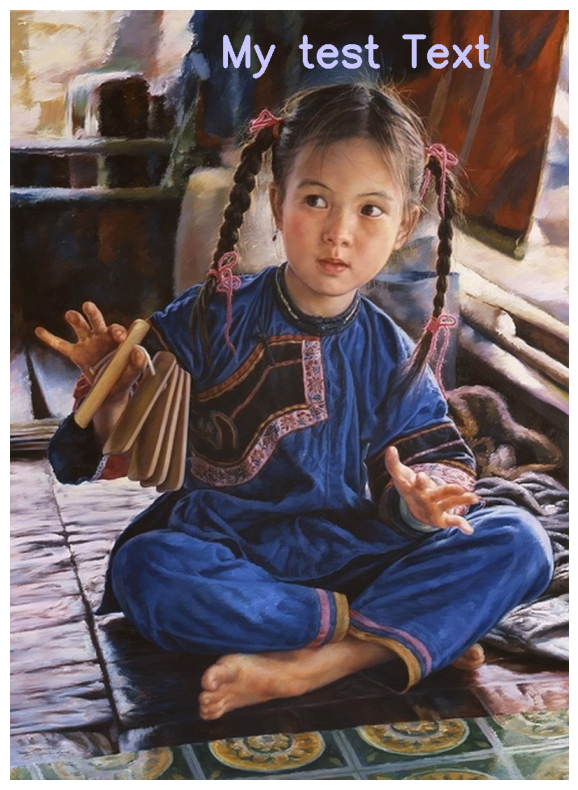

In [29]:
img = cv2.imread(IMG_PATH)
cv2.putText(img, "My test Text", (300, 80), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 200, 200), 5)
imshow(img)

---
### Find Contours

**Steps**:
1. Grayscale image
2. Blur the image
3. Binarize the image
4. find contours

```python
cv2.findContours(image, retrieval mode, approximation method)
```

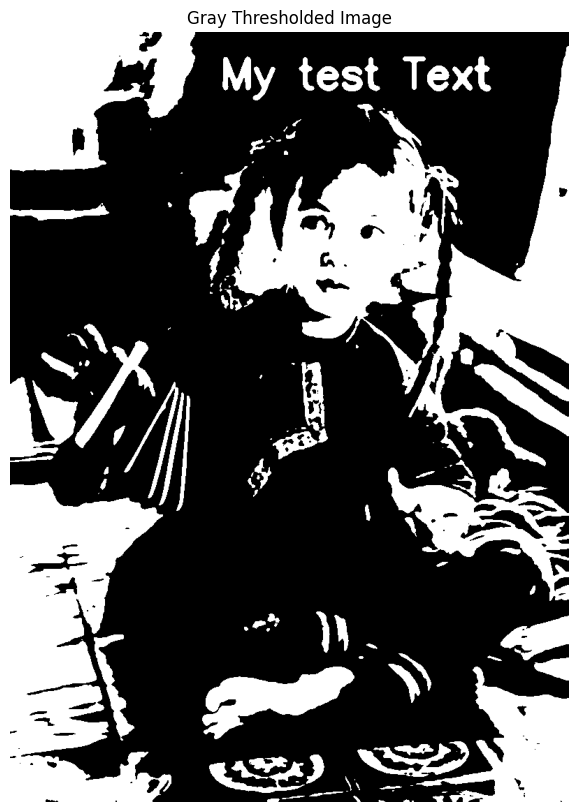

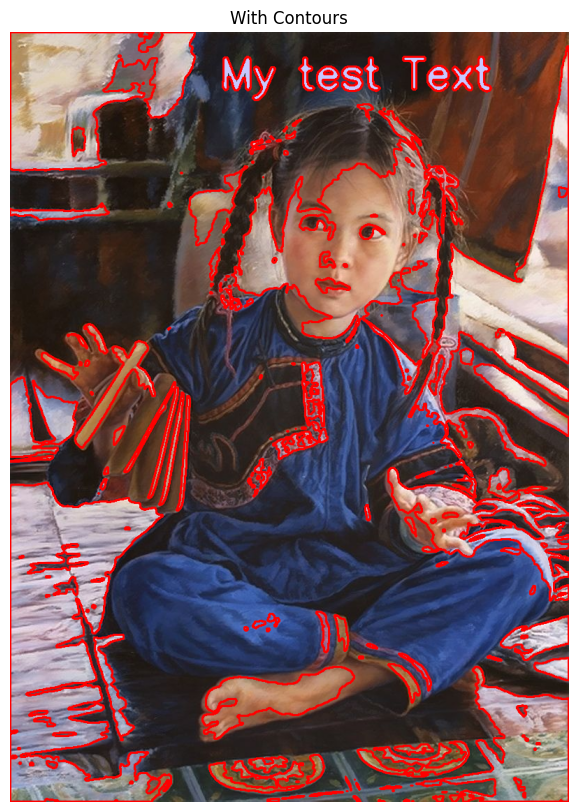

Number of contours: 243


In [30]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.blur(gray, ksize=(5, 5))
t, t_img = cv2.threshold(blur, 0, 255, cv2.THRESH_OTSU)
imshow(t_img, "Gray Thresholded Image")

contours, hierarchy = cv2.findContours(t_img, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

copy_img = img.copy()
cv2.drawContours(copy_img, contours, -1, (0, 0, 255), thickness=2)
imshow(copy_img, "With Contours")

print(f"Number of contours: {len(contours)}")

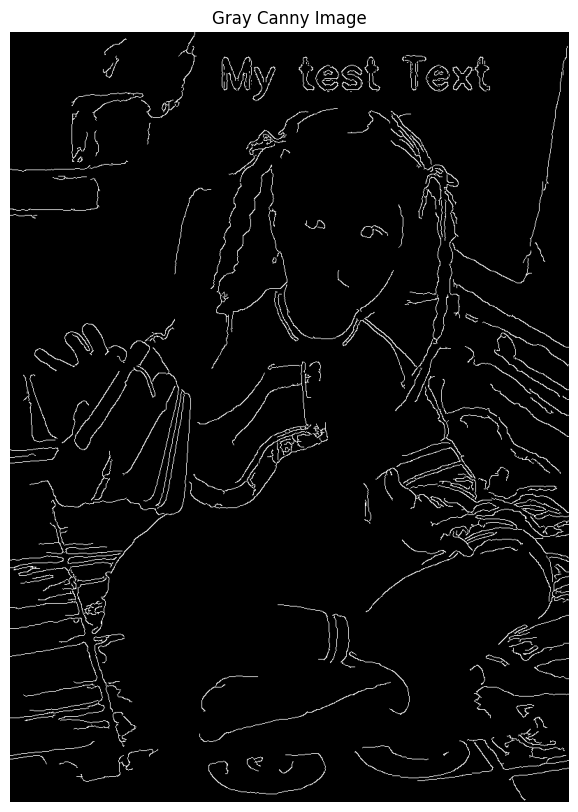

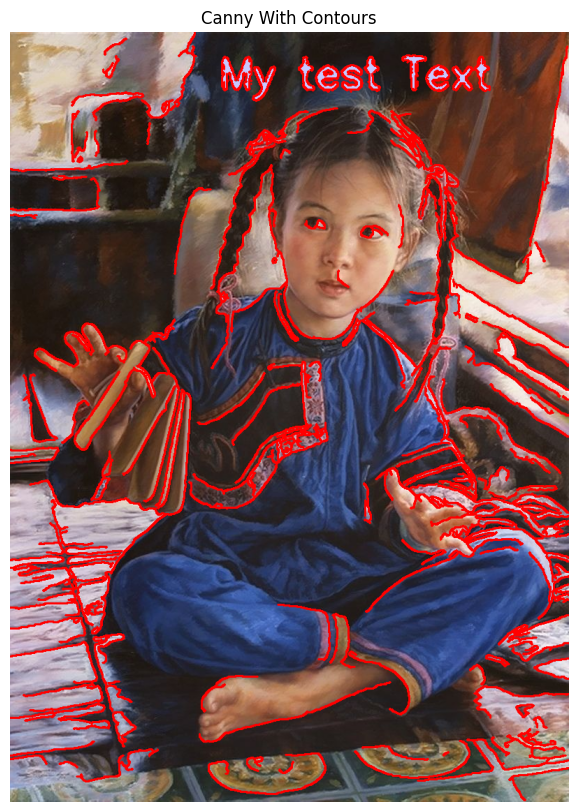

Number of contours: 376


In [31]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.blur(gray, ksize=(5, 5))
t_img = cv2.Canny(blur, 30, 200)
imshow(t_img, "Gray Canny Image")

contours, hierarchy = cv2.findContours(t_img, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

copy_img = img.copy()
cv2.drawContours(copy_img, contours, -1, (0, 0, 255), thickness=2)
imshow(copy_img, "Canny With Contours")

print(f"Number of contours: {len(contours)}")

---
### Retrieval Modes

**Retrieval Modes**
- **RETR_LIST** - Retrieves all the contours, but doesn't create any parent-child relationship. Parents and kids are equal under this rule, and they are just contours. ie they all belongs to same hierarchy level.
- **RETR_EXTERNAL** - eturns only extreme outer flags. All child contours are left behind.
- **RETR_CCOMP** - This flag retrieves all the contours and arranges them to a 2-level hierarchy. ie external contours of the object (ie its boundary) are placed in hierarchy-1. And the contours of holes inside object (if any) is placed in hierarchy-2. If any object inside it, its contour is placed again in hierarchy-1 only. And its hole in hierarchy-2 and so on.
- **RETR_TREE** -  It retrieves all the contours and creates a full family hierarchy list. 

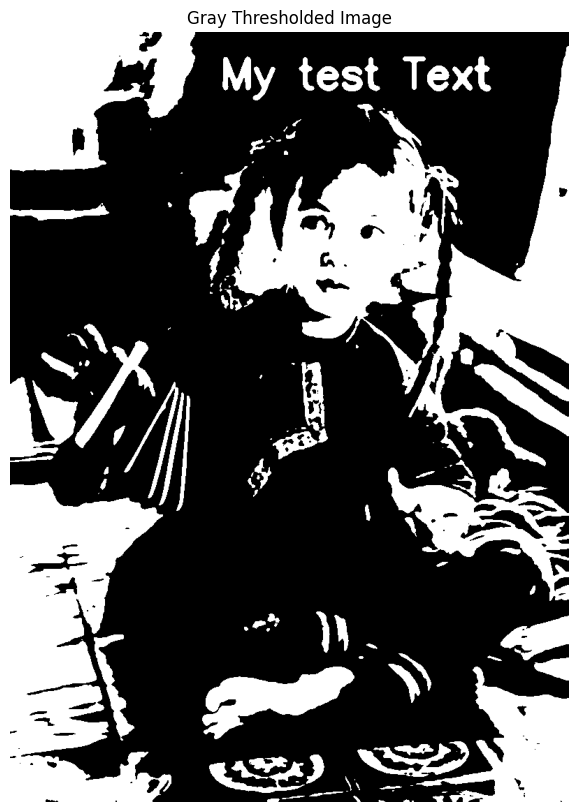

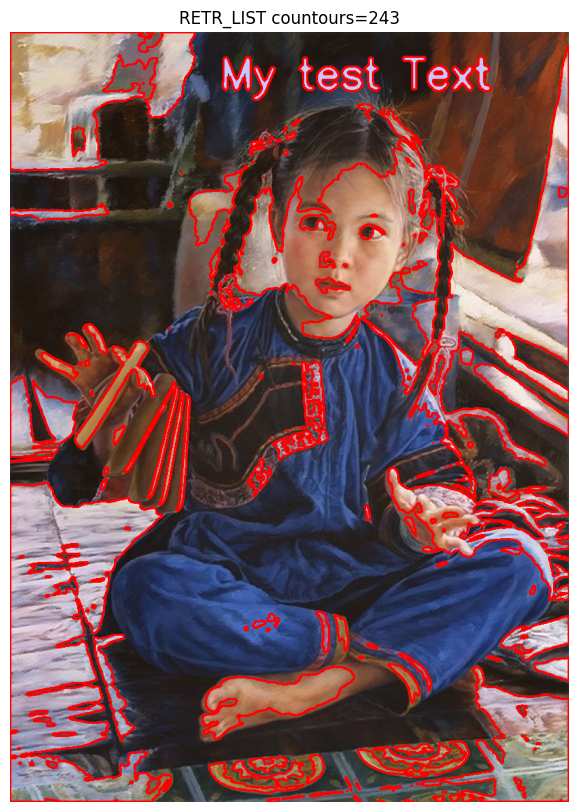

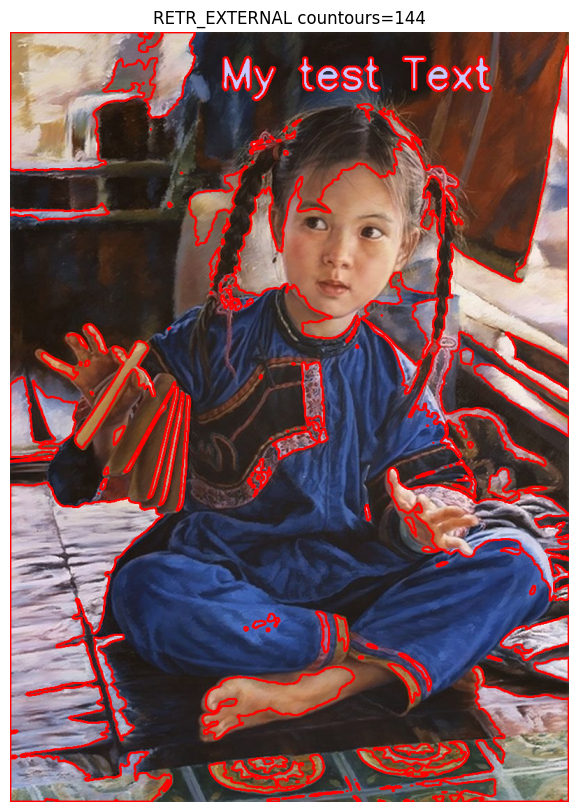

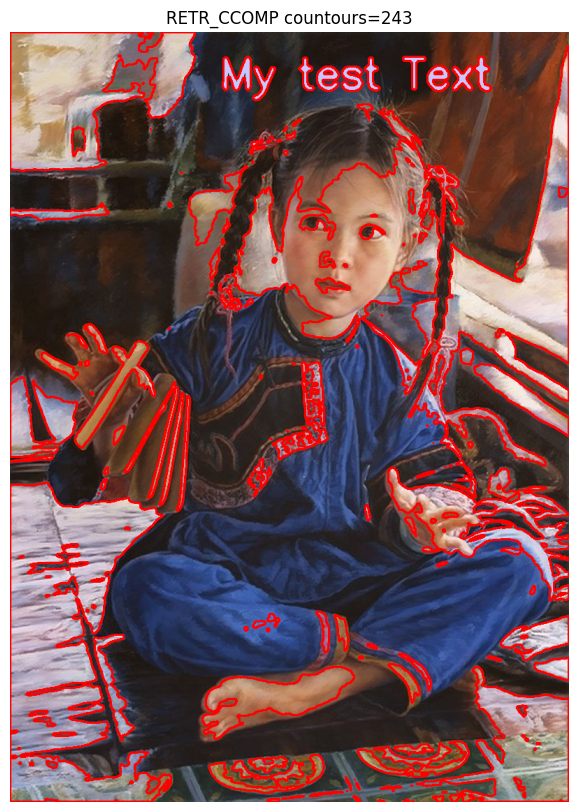

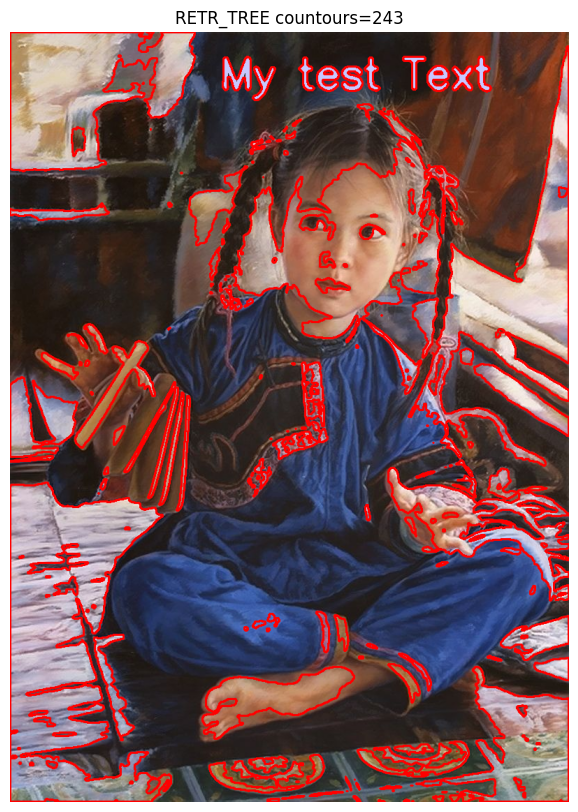

In [32]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.blur(gray, ksize=(5, 5))
t, t_img = cv2.threshold(blur, 0, 255, cv2.THRESH_OTSU)
imshow(t_img, "Gray Thresholded Image")

contours, hierarchy = cv2.findContours(t_img, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

copy_img = img.copy()
cv2.drawContours(copy_img, contours, -1, (0, 0, 255), thickness=2)
imshow(copy_img, f"RETR_LIST countours={len(contours)}")

contours, hierarchy = cv2.findContours(t_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
copy_img = img.copy()
cv2.drawContours(copy_img, contours, -1, (0, 0, 255), thickness=2)
imshow(copy_img, f"RETR_EXTERNAL countours={len(contours)}")

contours, hierarchy = cv2.findContours(t_img, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_NONE)
copy_img = img.copy()
cv2.drawContours(copy_img, contours, -1, (0, 0, 255), thickness=2)
imshow(copy_img, f"RETR_CCOMP countours={len(contours)}")

contours, hierarchy = cv2.findContours(t_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
copy_img = img.copy()
cv2.drawContours(copy_img, contours, -1, (0, 0, 255), thickness=2)
imshow(copy_img, f"RETR_TREE countours={len(contours)}")

---
### Contouring Modes

**Approximation Method Options**
- cv2.CHAIN_APPROX_NONE – Stores all the points along the line(inefficient!)
- cv2.CHAIN_APPROX_SIMPLE – Stores the end points of each line

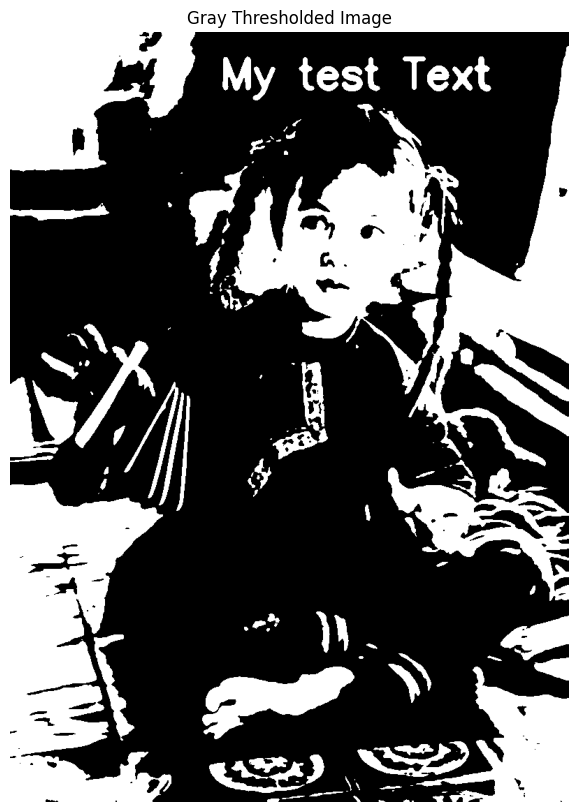

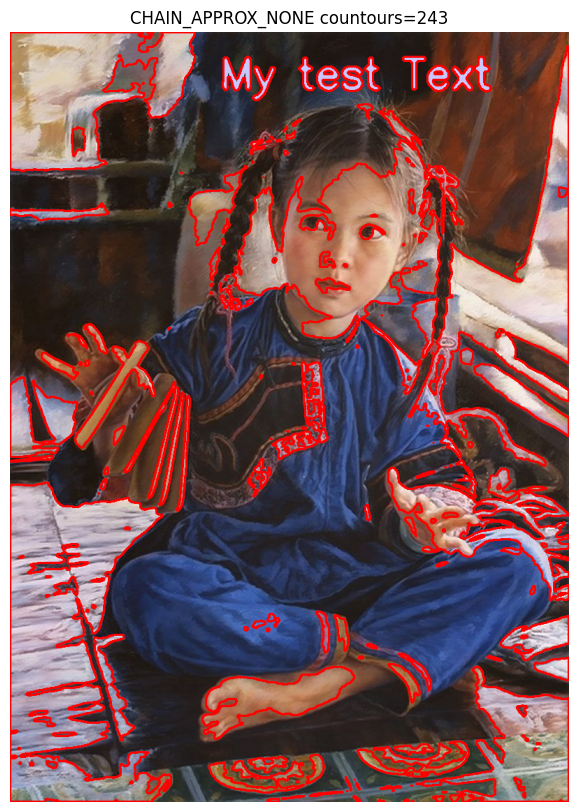

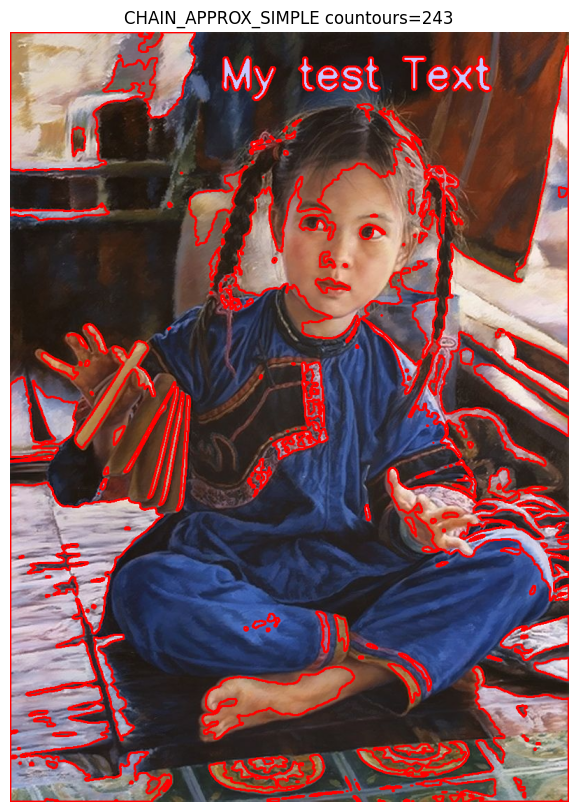

In [33]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.blur(gray, ksize=(5, 5))
t, t_img = cv2.threshold(blur, 0, 255, cv2.THRESH_OTSU)
imshow(t_img, "Gray Thresholded Image")

contours, hierarchy = cv2.findContours(t_img, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

copy_img = img.copy()
cv2.drawContours(copy_img, contours, -1, (0, 0, 255), thickness=2)
imshow(copy_img, f"CHAIN_APPROX_NONE countours={len(contours)}")

contours, hierarchy = cv2.findContours(t_img, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
copy_img = img.copy()
cv2.drawContours(copy_img, contours, -1, (0, 0, 255), thickness=2)
imshow(copy_img, f"CHAIN_APPROX_SIMPLE countours={len(contours)}")

It changes how the contour gets saved

---
### Extract the text

In [61]:
from IPython.display import clear_output

def find_contours(img, contours, start=0, end=None):
    contours = sorted(contours, key=lambda x:len(x), reverse=True)

    if end is None:
        end = len(contours)

    target_contours = []
    i = start
    while True:
        while True:
            clear_output(wait=True)
            copy_img = img.copy()
            cv2.drawContours(copy_img, contours[i], -1, (0, 0, 255), thickness=2)
            imshow(copy_img, f"index={i}, Point-1 ={contours[i][0]}")
            user_input = input("enter -> skip; x -> take it; q -> leave; redraw -> re; back -> b:")

            if user_input.lower() != "re":
                break

        if user_input.lower() == "x":
            target_contours += [contours[i]]
            i += 1
        elif user_input.lower() == "":
            if i == end-1:
                break
            else:
                i += 1
        elif user_input.lower() == "b":
            if i > start:
                i -= 1
        elif user_input.isnumeric():
            num = int(user_input.lower())
            if num >= start and num < end:
                i = num
        else:
            break
        
    clear_output(wait=True)
    copy_img = img.copy()
    cv2.drawContours(copy_img, target_contours, -1, (0, 0, 255), thickness=2)
    imshow(copy_img, f"Result Contour")
    return target_contours

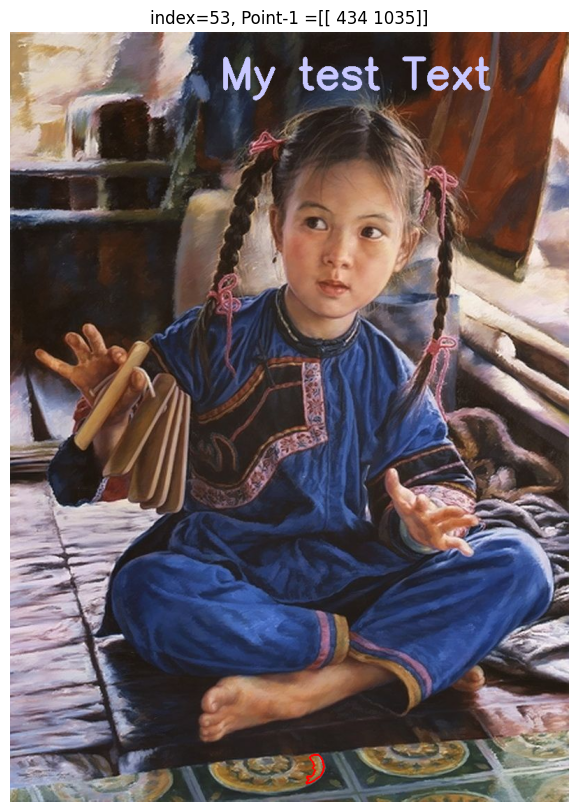

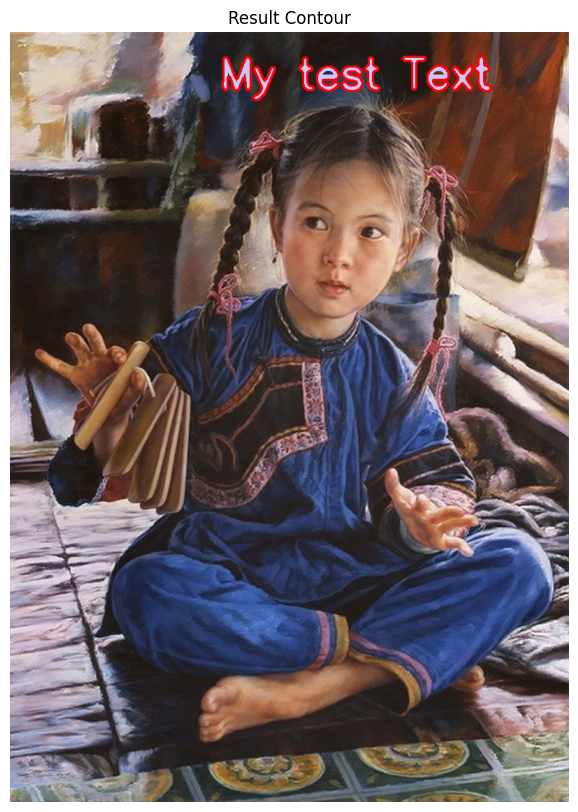

[array([[[339,  35]],
 
        [[338,  36]],
 
        [[337,  37]],
 
        [[336,  38]],
 
        [[336,  39]],
 
        [[335,  40]],
 
        [[335,  41]],
 
        [[335,  42]],
 
        [[334,  43]],
 
        [[334,  44]],
 
        [[333,  45]],
 
        [[333,  46]],
 
        [[333,  47]],
 
        [[332,  48]],
 
        [[332,  49]],
 
        [[331,  50]],
 
        [[331,  51]],
 
        [[331,  52]],
 
        [[330,  53]],
 
        [[330,  54]],
 
        [[330,  55]],
 
        [[329,  56]],
 
        [[329,  57]],
 
        [[329,  58]],
 
        [[328,  59]],
 
        [[328,  60]],
 
        [[327,  61]],
 
        [[327,  62]],
 
        [[327,  63]],
 
        [[326,  64]],
 
        [[326,  65]],
 
        [[325,  66]],
 
        [[324,  67]],
 
        [[323,  66]],
 
        [[322,  65]],
 
        [[322,  64]],
 
        [[321,  63]],
 
        [[321,  62]],
 
        [[320,  61]],
 
        [[320,  60]],
 
        [[320,  59]],
 
        [[319,  

In [63]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.blur(gray, ksize=(5, 5))
t, t_img = cv2.threshold(blur, 0, 255, cv2.THRESH_OTSU)

contours, hierarchy = cv2.findContours(t_img, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

find_contours(img, contours)

---